<a href="https://colab.research.google.com/github/menguelx7/Diplodatos/blob/main/Aprendizaje_no_Supervisado/TP_ApNoSup_Mati.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Aprendizaje no Supervisado - Año 2022

# GRUPO 1- Trabajo práctico entregable N°1
**********************************************************************

Integrantes: 


*   Laura Ailin Feu Marquestau
*   Matias Miguel Mengual Figueroa 
*   Marcelo Perea
*   Natalia Giselle Tassin
*   Ignacio Villagra Torcomian

Práctico entregable: 
Utilizar la base de jugadores “players_22.csv” disponible en la página de Kaggle https://www.kaggle.com/datasets/stefanoleone992/fifa-22-complete-player-dataset . Considerar que la base 2022 no tiene el mismo formato que la base vista en clase, a los nombres de las variables se les agregó una keyword para identificar a qué tipo de habilidad corresponde.

Con la nueva base, realizar un análisis análogo al que realizamos en el cursado de la materia con los datos FIFA2019. Realice comentarios en cada parte (verbose=True ;))


1.   Análisis exploratorio de la base.
2.   Evaluación visual  e intuitiva de a dos variables numéricas por vez.
3.   Uso de dos técnicas de clustering: por ejemplo k-medias, DBSCAN, mezcla de Gaussianas y/o alguna jerárquica. Elección justificada de hiper-parámetros
4.   Evaluación y Análisis de los clusters encontrados.
5.   Pregunta: ¿Se realizó alguna normalización o escalado de la base? ¿Por qué ?
6.   Uso de alguna transformación (proyección, Embedding) para visualizar los resultados y/o usarla como preprocesado para aplicar alguna técnica de clustering.




# Cargamos las librerias y el DataSet a utilizar


In [39]:
#Importamos las librerias que vamos a usar

import numpy as np
import pandas as pd
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',1000)
import itertools
import warnings
warnings.filterwarnings("ignore")
import io
from plotly.offline import init_notebook_mode, plot,iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization
import seaborn as sns

In [40]:
#cargamos el DataSet
df = pd.read_csv('https://raw.githubusercontent.com/menguelx7/Diplodatos/main/Aprendizaje_no_Supervisado/players_22.csv') 
df.head(3)

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,club_team_id,club_name,league_name,league_level,club_position,club_jersey_number,club_loaned_from,club_joined,club_contract_valid_until,nationality_id,nationality_name,nation_team_id,nation_position,nation_jersey_number,preferred_foot,weak_foot,skill_moves,international_reputation,work_rate,body_type,real_face,release_clause_eur,player_tags,player_traits,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,...,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,1987-06-24,170,72,73.0,Paris Saint-Germain,French Ligue 1,1.0,RW,30.0,NaN,2021-08-10,2023.0,52,Argentina,1369.0,RW,10.0,Left,4,4,5,Medium/Low,Unique,Yes,144300000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...","Finesse Shot, Long Shot Taker (AI), Playmaker ...",85.0,92.0,91.0,95.0,34.0,65.0,85,95,70,91,88,96,93,...,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93,93,93,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,1988-08-21,185,81,21.0,FC Bayern München,German 1. Bundesliga,1.0,ST,9.0,NaN,2014-07-01,2023.0,37,Poland,1353.0,RS,9.0,Right,4,4,5,High/Medium,Unique,Yes,197200000.0,"#Aerial Threat, #Distance Shooter, #Clinical F...","Solid Player, Finesse Shot, Outside Foot Shot,...",78.0,92.0,79.0,86.0,44.0,82.0,71,95,90,85,89,85,79,...,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,1985-02-05,187,83,11.0,Manchester United,English Premier League,1.0,ST,7.0,NaN,2021-08-27,2023.0,38,Portugal,1354.0,ST,7.0,Right,4,5,5,High/Low,Unique,Yes,83300000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...","Power Free-Kick, Flair, Long Shot Taker (AI), ...",87.0,94.0,80.0,88.0,34.0,75.0,87,95,90,80,86,88,81,...,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png


In [41]:
df.tail(3)

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,club_team_id,club_name,league_name,league_level,club_position,club_jersey_number,club_loaned_from,club_joined,club_contract_valid_until,nationality_id,nationality_name,nation_team_id,nation_position,nation_jersey_number,preferred_foot,weak_foot,skill_moves,international_reputation,work_rate,body_type,real_face,release_clause_eur,player_tags,player_traits,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,...,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
19236,262760,https://sofifa.com/player/262760/nathan-logue/...,N. Logue,Nathan Logue-Cunningham,CM,47,55,100000.0,500.0,21,2000-02-07,178,72,111131.0,Finn Harps,Rep. Ireland Airtricity League,1.0,RES,31.0,NaN,2021-06-18,2021.0,25,Republic of Ireland,NaN,NaN,NaN,Right,3,2,1,Medium/Medium,Lean (170-185),No,175000.0,NaN,NaN,60.0,37.0,45.0,49.0,41.0,52.0,39,32,43,49,37,47,37,...,56,50,34,51,38,45,46,39,36,38,44,48,8,6,7,10,6,NaN,45+2,45+2,45+2,46,46,46,46,46,47+2,47+2,47+2,48+2,47+2,47+2,47+2,48+2,47+2,46+2,46+2,46+2,47+2,47+2,45+2,45+2,45+2,47+2,12+2,https://cdn.sofifa.net/players/262/760/22_120.png,https://cdn.sofifa.net/teams/111131/60.png,https://cdn.sofifa.net/flags/ie.png,NaN,https://cdn.sofifa.net/flags/ie.png
19237,262820,https://sofifa.com/player/262820/luke-rudden/2...,L. Rudden,Luke Rudden,ST,47,60,110000.0,500.0,19,2002-04-23,173,66,111131.0,Finn Harps,Rep. Ireland Airtricity League,1.0,RES,12.0,NaN,2021-06-18,2021.0,25,Republic of Ireland,NaN,NaN,NaN,Right,3,2,1,Medium/Medium,Lean (170-185),No,239000.0,NaN,NaN,68.0,46.0,36.0,48.0,15.0,42.0,29,49,40,38,34,42,36,...,50,40,41,34,14,47,40,49,47,10,14,11,7,10,7,14,15,NaN,47+2,47+2,47+2,47,47,47,47,47,45+2,45+2,45+2,45+2,39+2,39+2,39+2,45+2,33+2,29+2,29+2,29+2,33+2,32+2,26+2,26+2,26+2,32+2,15+2,https://cdn.sofifa.net/players/262/820/22_120.png,https://cdn.sofifa.net/teams/111131/60.png,https://cdn.sofifa.net/flags/ie.png,NaN,https://cdn.sofifa.net/flags/ie.png
19238,264540,https://sofifa.com/player/264540/emanuel-lalch...,E. Lalchhanchhuaha,Emanuel Lalchhanchhuaha,CAM,47,60,110000.0,500.0,19,2002-02-06,167,61,113040.0,NorthEast United FC,Indian Super League,1.0,SUB,13.0,NaN,2021-08-31,2025.0,159,India,NaN,NaN,NaN,Right,3,2,1,Medium/Medium,Lean (170-),No,217000.0,NaN,NaN,68.0,38.0,45.0,48.0,36.0,48.0,39,32,46,50,37,48,38,...,57,40,36,55,42,47,46,35,36,33,31,37,8,13,13,9,14,NaN,45+2,45+2,45+2,47,47,47,47,47,47+2,47+2,47+2,48+2,46+2,46+2,46+2,48+2,45+2,44+2,44+2,44+2,45+2,45+2,41+2,41+2,41+2,45+2,16+2,https://cdn.sofifa.net/players/264/540/22_120.png,https://cdn.sofifa.net/teams/113040/60.png,https://cdn.sofifa.net/flags/in.png,NaN,https://cdn.sofifa.net/flags/in.png


# 1. Análisis exploratorio de la base.

In [42]:
#vemos el nombre las columnas que compónen nuestro DF
df.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name',
       'player_positions', 'overall', 'potential', 'value_eur', 'wage_eur',
       'age',
       ...
       'lcb', 'cb', 'rcb', 'rb', 'gk', 'player_face_url', 'club_logo_url',
       'club_flag_url', 'nation_logo_url', 'nation_flag_url'],
      dtype='object', length=110)

In [43]:
#Realizamos un describe 
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sofifa_id,19239.0,2.314681e+05,2.703972e+04,41.0,214413.5,236543.0,253532.5,264640.0
overall,19239.0,6.577218e+01,6.880232e+00,47.0,61.0,66.0,70.0,93.0
potential,19239.0,7.107937e+01,6.086213e+00,49.0,67.0,71.0,75.0,95.0
value_eur,19165.0,2.850452e+06,7.613700e+06,9000.0,475000.0,975000.0,2000000.0,194000000.0
wage_eur,19178.0,9.017989e+03,1.947018e+04,500.0,1000.0,3000.0,8000.0,350000.0
age,19239.0,2.521082e+01,4.748235e+00,16.0,21.0,25.0,29.0,54.0
height_cm,19239.0,1.812997e+02,6.863179e+00,155.0,176.0,181.0,186.0,206.0
weight_kg,19239.0,7.494303e+01,7.069434e+00,49.0,70.0,75.0,80.0,110.0
club_team_id,19178.0,5.058050e+04,5.440187e+04,1.0,479.0,1938.0,111139.0,115820.0
league_level,19178.0,1.354364e+00,7.478651e-01,1.0,1.0,1.0,1.0,5.0


In [44]:
from pandas.api.types import is_numeric_dtype

def info_univariado(df):
  df_info = pd.DataFrame(columns=['Cantidad', 'Tipo' , 'Missing', 'Unicos', 'Numeric'])
  for col in df:
    data_series = df[col]
    df_info.loc[col] = [data_series.count(), data_series.dtype, data_series.isnull().sum(), data_series.nunique(), is_numeric_dtype(data_series)]
    df_describe = df.describe(include='all').T[['top', 'mean', 'std', 'min', '25%', '50%', '75%', 'max']]
    df_stats = pd.DataFrame([df.skew(), df.kurtosis()], index=['sesgo', 'kurt']).T
  return pd.concat([df_info,pd.concat([df_describe, df_stats], axis=1)], axis=1).fillna('0')

df_uni_stats = info_univariado(df)
df_uni_stats

,Cantidad,Tipo,Missing,Unicos,Numeric,top,mean,std,min,25%,50%,75%,max,sesgo,kurt
sofifa_id,19239,int64,0,19239,True,0,231468.086959,27039.717497,41.0,214413.5,236543.0,253532.5,264640.0,-1.46074,5.385233
player_url,19239,object,0,19239,False,https://sofifa.com/player/158023/lionel-messi/...,0,0,0,0,0,0,0,0,0
short_name,19239,object,0,18145,False,J. Rodríguez,0,0,0,0,0,0,0,0,0
long_name,19239,object,0,19219,False,Ladislav Krejčí,0,0,0,0,0,0,0,0,0
player_positions,19239,object,0,674,False,CB,0,0,0,0,0,0,0,0,0
overall,19239,int64,0,47,True,0,65.772182,6.880232,47.0,61.0,66.0,70.0,93.0,0.081602,0.091004
potential,19239,int64,0,46,True,0,71.07937,6.086213,49.0,67.0,71.0,75.0,95.0,0.165786,0.106171
value_eur,19165,float64,74,252,True,0,2850451.813201,7613699.947459,9000.0,475000.0,975000.0,2000000.0,194000000.0,8.186343,97.897519
wage_eur,19178,float64,61,133,True,0,9017.989363,19470.176724,500.0,1000.0,3000.0,8000.0,350000.0,6.47215,63.06734
age,19239,int64,0,29,True,0,25.210822,4.748235,16.0,21.0,25.0,29.0,54.0,0.431183,-0.413828


In [45]:
#Corroboramos si tenemos datos duplicados
df.duplicated().sum()

0

Podemos corroborar que nuestro DataFrame no contiene datos duplicados

In [46]:
#Con el shape corroboramos cuantas filas y columnas tenemos en nuestro DF
df.shape

(19239, 110)

Nuestro DataFrame tiene:
*   19239 Filas
*   110 Columnas



In [47]:
#Corroboramos que tipo de dato corresponde a cada columna
df.dtypes

sofifa_id                        int64
player_url                      object
short_name                      object
long_name                       object
player_positions                object
overall                          int64
potential                        int64
value_eur                      float64
wage_eur                       float64
age                              int64
dob                             object
height_cm                        int64
weight_kg                        int64
club_team_id                   float64
club_name                       object
league_name                     object
league_level                   float64
club_position                   object
club_jersey_number             float64
club_loaned_from                object
club_joined                     object
club_contract_valid_until      float64
nationality_id                   int64
nationality_name                object
nation_team_id                 float64
nation_position          

Los tipos de datos que contiene nuestro DataFrame son:
*   int64
*   object
*   float64



In [48]:
#Vamos a sumar los nulos en todo el DF
df.isnull().sum()

sofifa_id                          0
player_url                         0
short_name                         0
long_name                          0
player_positions                   0
overall                            0
potential                          0
value_eur                         74
wage_eur                          61
age                                0
dob                                0
height_cm                          0
weight_kg                          0
club_team_id                      61
club_name                         61
league_name                       61
league_level                      61
club_position                     61
club_jersey_number                61
club_loaned_from               18137
club_joined                     1163
club_contract_valid_until         61
nationality_id                     0
nationality_name                   0
nation_team_id                 18480
nation_position                18480
nation_jersey_number           18480
p

Podemos validar que de las 110 columnas que tiene nuestro DataFrame 27 de ellas contienen datos nulos, los cuales son:

*   value_eur con 74 nulls
*   wage_eur con 64 nulls
*   club_team_id con 61 nulls
*   club_name con 61 nulls
*   league_name con 61 nulls
*   league_level con 61 nulls
*   club_position con 61 nulls
*   club_jersey_number con 61 nulls
*   club_loaned_from con 18137 nulls
*   club_joined con 1163 nulls
*   club_contract_valid_until con 61 nulls
*   nation_team_id con 18480 nulls
*   nation_position con 18480 nulls
*   nation_jersey_number con 18480 nulls
*   release_clause_eur con 1176 nulls
*   player_tags con 17798 nulls
*   player_traits con 9841 nulls 
*   pace con 2132 nulls
*   shooting con 2132 nulls
*   passing con 2132 nulls
*   dribbling con 2132 nulls
*   defending con 2132 nulls
*   physic con 2132 nulls
*   goalkeeping_speed con 17107 nulls
*   club_logo_url con 61 nulls
*   club_flag_url con 61 nulls
*   nation_logo_url con 18480 nulls

In [49]:
#Ahora veamos los datos unicos delDF
df.nunique()

sofifa_id                      19239
player_url                     19239
short_name                     18145
long_name                      19219
player_positions                 674
overall                           47
potential                         46
value_eur                        252
wage_eur                         133
age                               29
dob                             6312
height_cm                         49
weight_kg                         58
club_team_id                     701
club_name                        701
league_name                       55
league_level                       5
club_position                     29
club_jersey_number                99
club_loaned_from                 334
club_joined                     1845
club_contract_valid_until          9
nationality_id                   163
nationality_name                 163
nation_team_id                    33
nation_position                   28
nation_jersey_number              28
p

# 2. Evaluación visual e intuitiva de a dos variables numéricas por vez.

Vamos a comenzar graficando en dos dimensiones pares de columnas que caracterizan a las habilidades de los jugadores.
Podemos notar que para cierta combinación de variables -donde en mayor medida se ve attacking_heading_accuracy- se forman dos cúmulos bien diferenciados. Uno pequeño cerca del origen y otro más grande alejándose de él. 

Para otras combinaciones de variables, notamos que los puntos se acomodan, tratando de seguir una línea diagonal a los ejes.

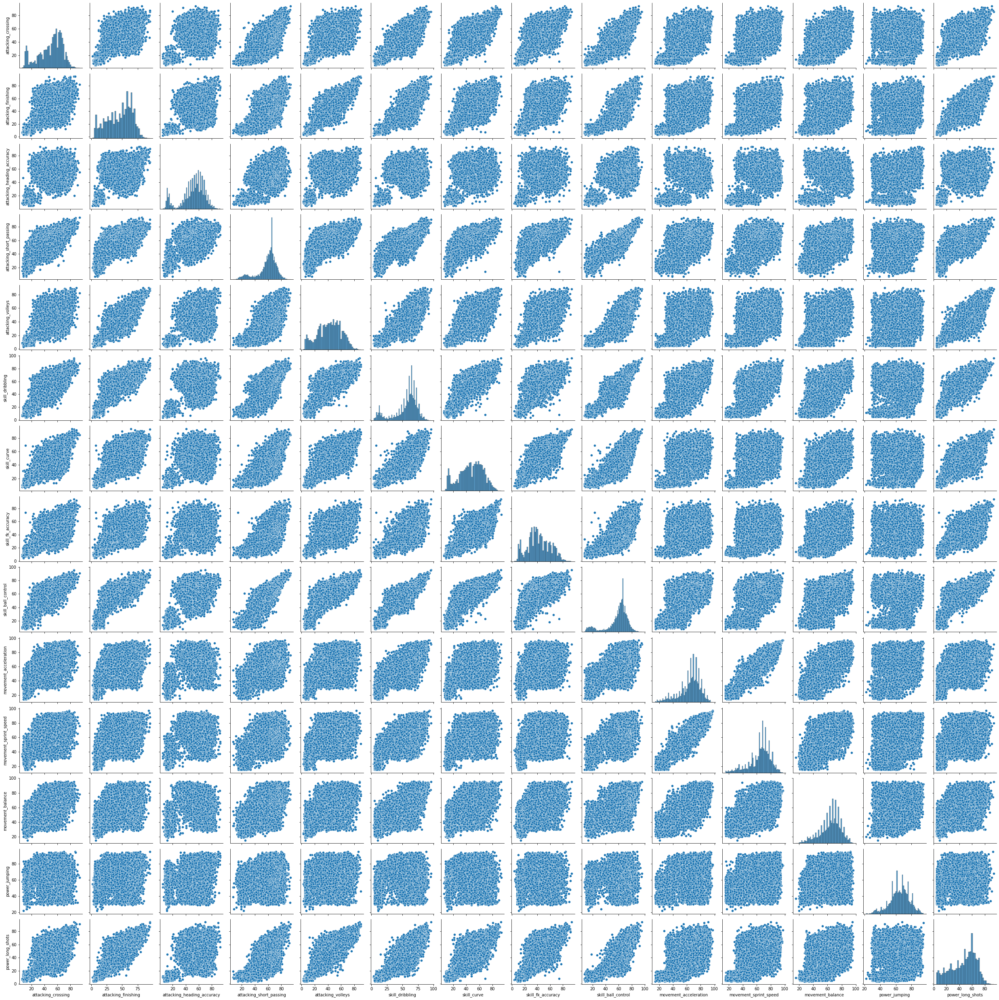

In [50]:
skills=[ "attacking_crossing" , "attacking_finishing" , "attacking_heading_accuracy" ,
           "attacking_short_passing" , "attacking_volleys" , "skill_dribbling" , "skill_curve" , "skill_fk_accuracy" , "skill_ball_control" , "movement_acceleration" ,
           "movement_sprint_speed" ,  "movement_balance" , "power_jumping" , "power_long_shots"]
skills_df=df[skills]

sns.pairplot(skills_df[skills])

De estos cúmulos de datos nos queda saber qué grupo, clase o tipo de jugadores tenemos diferenciados. 

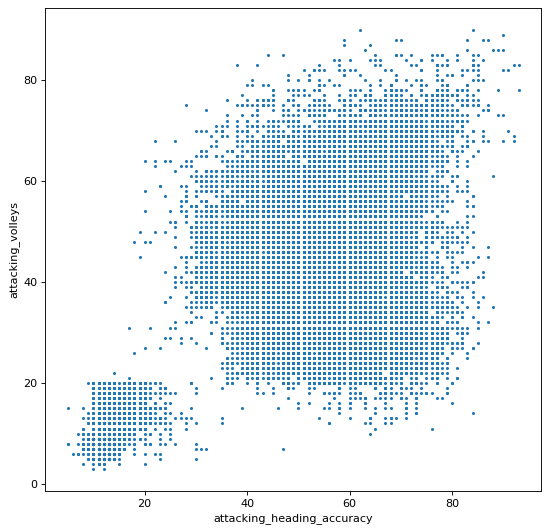

In [51]:
skill_1=skills[2] #5,  2
skill_2=skills[4]  #29, 4 
plt.figure(figsize=(8,8), dpi=80)
plt.scatter(skills_df[skill_1], y=skills_df[skill_2],s=3,cmap='jet')
plt.xlabel(skill_1)
plt.ylabel(skill_2)
plt.show()

Tratamos de reagrupar las posiciones de los jugadores en una cantidad más acotada: Delanteros, Mediocampistas, Defensores y Arqueros. 

In [52]:
forwards=['RF', 'ST', 'LW', 'LF', 'RS', 'LS', 'RM', 'LM','RW']
midfielders=['RCM','LCM','LDM','CAM','CDM','LAM','RDM','CM','RAM','CF']
defenders=['RCB','CB','LCB','LB','RB','RWB','LWB']
goalkeepers=['GK']

def pos2(position):
    if position in forwards:
        return 'Forward'
    
    elif position in midfielders:
        return 'Midfielder'
    
    elif position in defenders:
        return 'Defender'
    
    elif position in goalkeepers:
        return 'GK'
    
    else:
        return 'nan'

In [53]:
df["Position"]=df["player_positions"].apply(lambda x: pos2(x))

df["Position"].value_counts()

nan           9809
Defender      3657
Forward       2377
GK            2132
Midfielder    1264
Name: Position, dtype: int64

In [54]:
bool_crack=df["overall"] > 85
graf1 = go.Scatter(x=skills_df[skill_1], y=skills_df[skill_2],
                           mode='markers',
                        text=df.loc[:,'Position'], #'Height', 'Weight', 'Club', 'Age', 'Name','Position'
                           marker=dict(
                                size=5)
                           )

crack =go.Scatter(x=skills_df.loc[bool_crack,skill_1], y=skills_df.loc[bool_crack,skill_2],name='Top players',
                      text=df.loc[bool_crack,'Position'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[graf1,crack]

layout = go.Layout(title="Visualización de la base de a dos variables numéricas",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

fig.show(renderer="colab")

Vemos que en el pequeño grupo separado cerca del origen de ejes, se agrupan íntegramente los GK (goal keeper) o arqueros, mientras que el resto de jugadores se distribuyen en el cúmulo de mayor tamaño.



---

A continuación probaremos analizando un nuevo grupo de variables las cuales no están tan directamente relacionadas con las habilidades físicas o "skills" de los jugadores.

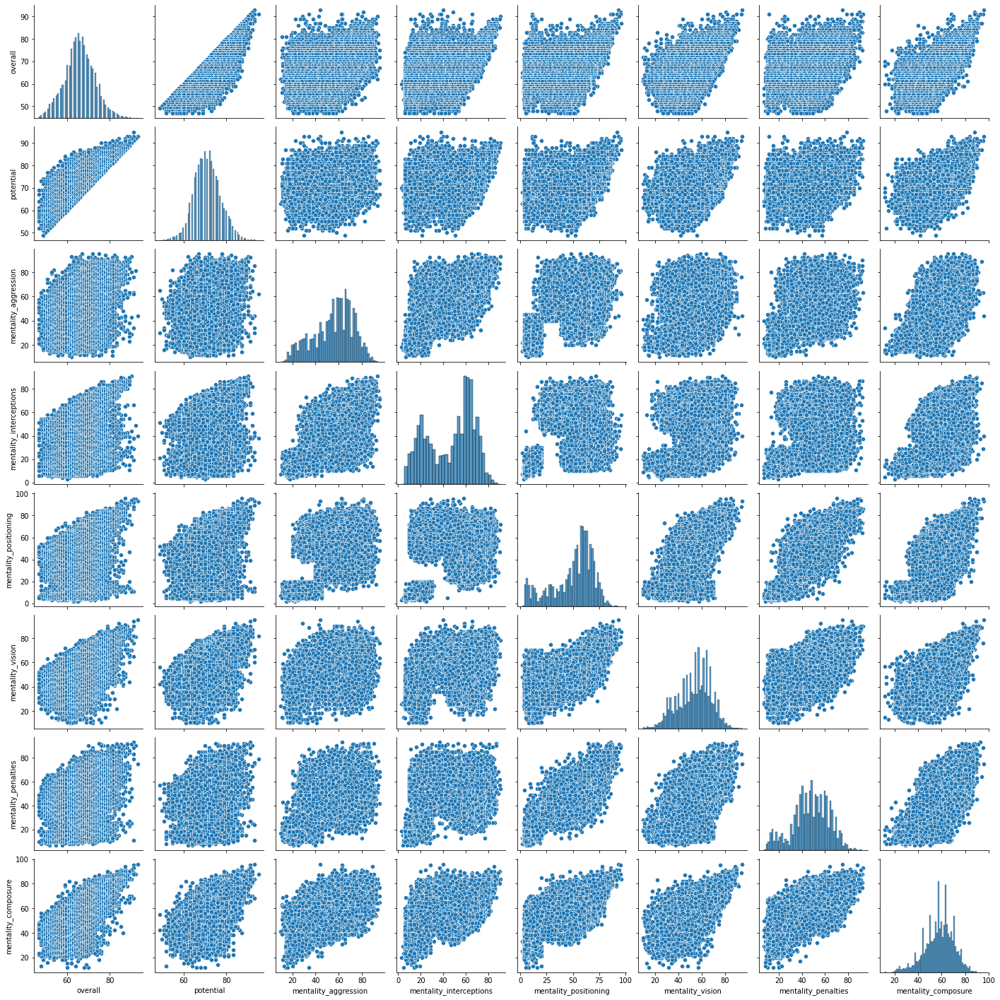

In [55]:
others=["overall",	"potential", "mentality_aggression",	"mentality_interceptions",	"mentality_positioning",	"mentality_vision",	"mentality_penalties",	"mentality_composure"]
others_df=df[others]

sns.pairplot(others_df[others])


Notamos que hay un cierto grupo de atributos en los cuales se puede percibir una separación clara entre dos grandes grupos. Dicha separación es muy similar a la de la comparación de las variables mas "físicas". A continuación vamos a visualizar dos, donde claramente se vuelven a ver los arqueros completamente separados del resto de jugadores. Sin embargo, si se presta atención en el cumulo de mayor tamaño, los delanteros o "forward" se encuentran mayormente distribuídos en la parte superior.  Se observa un pequeño grupo de mediocampistas en la diagonal opuesta a los arqueros y finalmente en el borde derecho se distribuyen mayormente los defensores.

In [56]:
other_1=others[3] #5,  2
other_2=others[4] 
bool_crack=df["overall"] > 85
graf1 = go.Scatter(x=others_df[other_1], y=others_df[other_2],
                           mode='markers',
                        text=df.loc[:,'Position'], #'Height', 'Weight', 'Club', 'Age', 'Name','Position'
                           marker=dict(
                                size=5)
                           )

crack =go.Scatter(x=others_df.loc[bool_crack,other_1], y=others_df.loc[bool_crack,other_2],name='Top players',
                      text=df.loc[bool_crack,'Position'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[graf1,crack]

layout = go.Layout(title="Visualización de la base de a dos variables numéricas",titlefont=dict(size=20),
                xaxis=dict(title=other_1),
                yaxis=dict(title=other_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

fig.show(renderer="colab")

# 3.   Uso de dos técnicas de clustering: por ejemplo k-medias, DBSCAN, mezcla de Gaussianas y/o alguna jerárquica. Elección justificada de hiper-parámetros

Vamos a comenzar aplicando K-medias como método de clustering. Por lo visto en clases, es sabido que este método va a forzar la división de clusters según la cantidad pedida por el usuario. En este caso esta cantidad será 4, en base a las posiciones de los jugadores. 

Adicional a esto, volveremos a hacer la misma comparación entre dos sets de variables, uno más relacionado a las habilidades físicas del jugador y otro relacionado más al comportamiento del jugador. 

**Tecnica de clustering: K-medias**

In [57]:
from sklearn.cluster import KMeans,MeanShift
n_clust = 4
km = KMeans(n_clusters=n_clust)
km.fit(skills_df)
clusters = km.labels_

df_clusters=df.copy()
df_clusters['kmeans_n'] = km.labels_

In [58]:
kmean_clusters = go.Scatter(x=skills_df[skill_1], y=skills_df[skill_2],
                           mode='markers',
                        text=df.loc[:,'Position'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=skills_df.loc[bool_crack,skill_1], y=skills_df.loc[bool_crack,skill_2],name='Ckacks!!',
                      text=df.loc[bool_crack,'Position'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,crack]

layout = go.Layout(title="Clustering K means ",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

En la grafica de 2D es facil ver la separación entre el cumulo de menor tamaño con respecto al de mayor, pero no es tan evidente la separación de las tres clases que se encuentran dentro de la nube de puntos de mayor tamaño. No se presenta una separación bien definida por posiciones en la cancha por ejemplo. 

In [59]:
fig.show(renderer="colab")

Probaremos haciendo una gráfica de 3 dimensiones a fin de ver si existe una división clara entre estos clusters de datos.

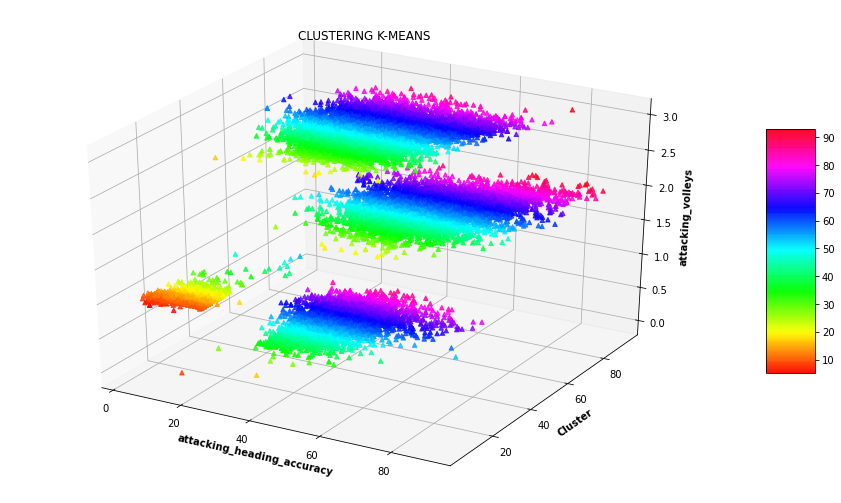

In [60]:
z = df_clusters['kmeans_n']
x = df_clusters['attacking_volleys']
y = df_clusters['attacking_heading_accuracy']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("CLUSTERING K-MEANS")
ax.set_xlabel('attacking_heading_accuracy', fontweight ='bold')
ax.set_ylabel('Cluster', fontweight ='bold')
ax.set_zlabel('attacking_volleys', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()



---
Ahora veremos probando el modelo de K-medias con el otro conjunto de características que ya habíamos mencionado. 


In [61]:
n_clust = 4
km = KMeans(n_clusters=n_clust)
km.fit(others_df)
clusters = km.labels_

df_clusters=df.copy()
df_clusters['kmeans_n'] = km.labels_
kmean_clusters = go.Scatter(x=others_df[other_1], y=others_df[other_2],
                           mode='markers',
                        text=df.loc[:,'Position'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=others_df.loc[bool_crack,other_1], y=others_df.loc[bool_crack,other_2],name='Ckacks!!',
                      text=df.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,crack]

layout = go.Layout(title="Clustering K means ",titlefont=dict(size=20),
                xaxis=dict(title=other_1),
                yaxis=dict(title=other_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

En la siguiente gráfica 2D, se muestran dos nubes de puntos bien diferenciadas, donde K-medias exitosamente separa una de ellas. En el caso del cumulo de puntos de mayor tamaño, vemos que K medias lo separó en tres grupos sin un limite evidente entre ellos. 

In [62]:
fig.show(renderer="colab")

Llevandolo a un espacio tridimencional, vemos que dicha separación se torna mas evidente.

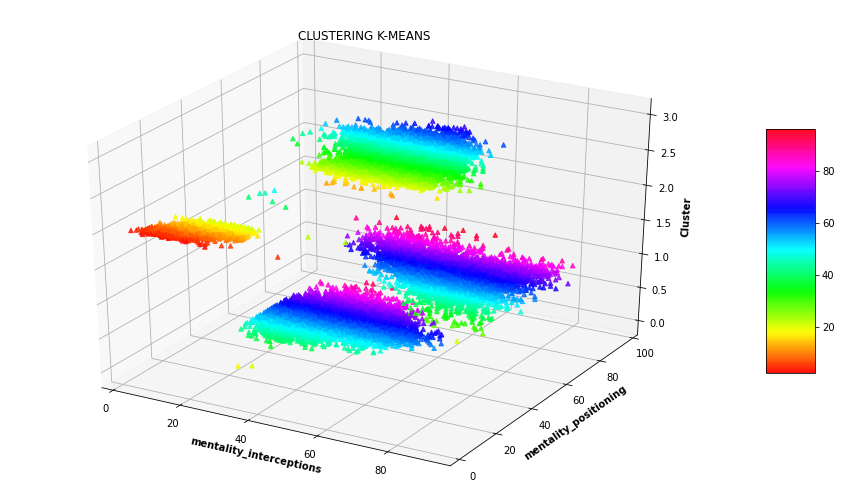

In [63]:
z = df_clusters['kmeans_n']
x = df_clusters['mentality_interceptions']
y = df_clusters['mentality_positioning']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("CLUSTERING K-MEANS")
ax.set_xlabel('mentality_interceptions', fontweight ='bold')
ax.set_ylabel('mentality_positioning', fontweight ='bold')
ax.set_zlabel('Cluster', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()

**Tecnica de clustering: DBSCAN**

Text(0, 0.5, 'Distance')

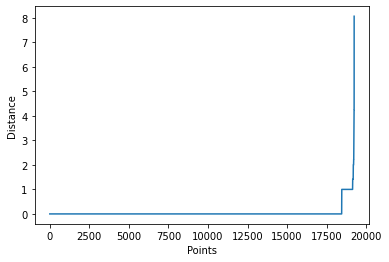

In [64]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
#BUSCAR EPSILON
k = 4
data_nn = df_clusters.copy()[['attacking_volleys', 'attacking_heading_accuracy']]

# Calculate NN
nearest_neighbors = NearestNeighbors(n_neighbors=k)
neighbors = nearest_neighbors.fit(data_nn)
distances, indices = neighbors.kneighbors(data_nn)
distances = np.sort(distances, axis=0)

# Get distances
distances = distances[:,1]

i = np.arange(len(distances))

sns.lineplot(
    x = i, 
    y = distances
)

plt.xlabel("Points")
plt.ylabel("Distance")

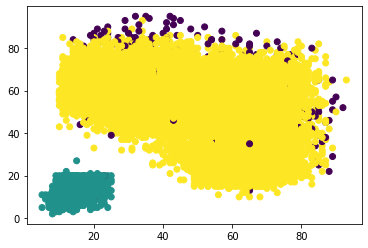

In [65]:
df_clusters['dbscan'] = DBSCAN(eps=6, min_samples=200).fit_predict(df_clusters[['attacking_volleys', 'attacking_heading_accuracy']])
plt.scatter(
    df_clusters['defending_standing_tackle'],
    df_clusters['attacking_finishing'],
    c = df_clusters['dbscan']
    #c = df_n['Position3']
    
)

In [66]:
df_clusters['dbscan'].value_counts()

 1    16891
 0     2117
-1      231
Name: dbscan, dtype: int64

In [67]:
df_clusters[df_clusters['dbscan'] == 0]['player_positions'].value_counts().head(10)

GK         2116
CAM, CF       1
Name: player_positions, dtype: int64

In [68]:
df_clusters[df_clusters['dbscan'] == -1]['player_positions'].value_counts().head(10)

ST         44
CB         31
GK         15
CAM, CM     9
CM, CDM     8
RM, LM      6
CM          5
CM, CAM     4
CAM         4
CF, ST      3
Name: player_positions, dtype: int64

In [69]:
df_clusters[df_clusters['dbscan'] == 1]['player_positions'].value_counts().head(10)

CB         2392
ST         1726
CDM, CM     951
CM          721
CM, CDM     679
LB          615
RB          576
CB, RB      294
CDM         293
CAM, CM     240
Name: player_positions, dtype: int64

Text(0, 0.5, 'Distance')

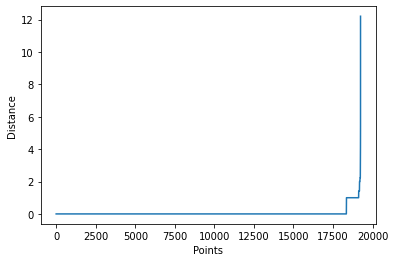

In [70]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
#BUSCAR EPSILON
k = 4
data_nn = df_clusters.copy()[['mentality_interceptions', 'mentality_positioning']]

# Calculate NN
nearest_neighbors = NearestNeighbors(n_neighbors=k)
neighbors = nearest_neighbors.fit(data_nn)
distances, indices = neighbors.kneighbors(data_nn)
distances = np.sort(distances, axis=0)

# Get distances
distances = distances[:,1]

i = np.arange(len(distances))

sns.lineplot(
    x = i, 
    y = distances
)

plt.xlabel("Points")
plt.ylabel("Distance")

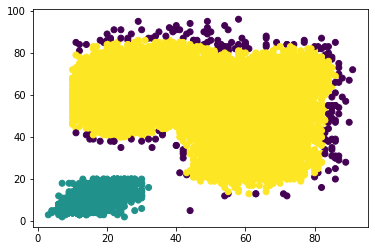

In [71]:
df_clusters['dbscan'] = DBSCAN(eps=6, min_samples=200).fit_predict(df_clusters[['mentality_interceptions', 'mentality_positioning']])
plt.scatter(
    df_clusters['mentality_interceptions'],
    df_clusters['mentality_positioning'],
    c = df_clusters['dbscan']
    #c = df_n['Position3']
)    

**Tecnica de clustering: Mean-Shift**

In [87]:
ms = MeanShift(bandwidth=25, bin_seeding=True)

ms.fit(skills_df)

clusters2 = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(clusters2)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)


Cantidad de clusters encontrados por Mean Shift : 121


In [85]:
kmean_clusters = go.Scatter(x=skills_df[skill_1], y=skills_df[skill_2],
                           mode='markers',
                        text=df_clusters.loc[:,'Position'],
                           marker=dict(
                                size=5,
                                color = clusters2.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=skills_df.loc[bool_crack,skill_1], y=skills_df.loc[bool_crack,skill_2],name='Ckacks!!',
                      text=df_clusters.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,crack]

layout = go.Layout(title="Clustering K means ",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

fig.show(renderer="colab")

In [84]:
ms = MeanShift(bandwidth=20, bin_seeding=True)

ms.fit(others_df)

clusters2 = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(clusters2)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)


Cantidad de clusters encontrados por Mean Shift : 6


In [86]:
kmean_clusters = go.Scatter(x=others_df[other_1], y=others_df[other_2],
                           mode='markers',
                        text=df_clusters.loc[:,'Position'],
                           marker=dict(
                                size=5,
                                color = clusters2.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=others_df.loc[bool_crack,other_1], y=others_df.loc[bool_crack,other_2],name='Ckacks!!',
                      text=df_clusters.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,crack]

layout = go.Layout(title="Clustering K means ",titlefont=dict(size=20),
                xaxis=dict(title=other_1),
                yaxis=dict(title=other_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

fig.show(renderer="colab")